In [2]:
from typing import List 
import random 
import numpy as np 
import pandas as pd
import glob 
from nltk import tokenize, download 
import string 
import time 
from collections import Counter 
import seaborn as sns 
import matplotlib.pyplot as plt 
import nltk
from nltk.stem.porter import PorterStemmer

download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
#splitting text and cleaning
def split_text(filepath: str, min_char: int = 5) -> List[str]:
    
    text = str()
    with open(filepath, 'r', encoding='utf8') as file:
        
        # this separates by line 
        text = file.read().replace('\n', '. ')
        
        # this replaces multiple characters 
        text = text.replace('.”', '”.').replace('."', '".').replace('?”', '”?').replace('!”', '”!')
        text = text.replace('--', ' ').replace('. . .', '').replace('_', '')
    
    sentences = tokenize.sent_tokenize(text)    
    sentences = [sentence for sentence in sentences if len(sentence) >= min_char]

    return list(sentences)

In [4]:
# reading the files 

Farmer_Giles_of_Ham = []
for path_1 in glob.glob('Farmer_Giles_of_Ham.txt'):
    Farmer_Giles_of_Ham.extend(split_text(path_1))

LEAF_BY_NIGGLE = []
for path_2 in glob.glob('LEAF_BY_NIGGLE.txt'):
    LEAF_BY_NIGGLE.extend(split_text(path_2))
    
On_Fairy_stories = []
for path_3 in glob.glob('On_Fairy_stories.txt'):
    On_Fairy_stories.extend(split_text(path_3))
    
SMITH_OF_WOOTTON_MAJOR = []
for path_4 in glob.glob('SMITH_OF_WOOTTON_MAJOR.txt'):
    SMITH_OF_WOOTTON_MAJOR.extend(split_text(path_4))
                
The_Adventures_of_Tom_Bombadil = []
for path_5 in glob.glob('The_Adventures_of_Tom_Bombadil.txt'):
    The_Adventures_of_Tom_Bombadil.extend(split_text(path_5))
    
The_Fellowship_of_the_Ring = []
for path_6 in glob.glob('The_Fellowship_of_the_Ring.txt'):
    The_Fellowship_of_the_Ring.extend(split_text(path_6))
    
The_Homecoming_of_Beorhtnoth_Beorhthelm = []
for path_7 in glob.glob('The_Homecoming_of_Beorhtnoth_Beorhthelm.txt'):
    The_Homecoming_of_Beorhtnoth_Beorhthelm.extend(split_text(path_7))
    
The_Hobbit = []
for path_8 in glob.glob('The_Hobbit.txt'):
    The_Hobbit.extend(split_text(path_8))
    
The_Two_Towers = []
for path_9 in glob.glob('The_Two_Towers.txt'):
    The_Two_Towers.extend(split_text(path_9))

The_Return_of_the_King = []
for path_10 in glob.glob('The_Return_of_the_King.txt'):
    The_Return_of_the_King.extend(split_text(path_10))

In [5]:

text_dictionary = {
    'Farmer_Giles_of_Ham': Farmer_Giles_of_Ham,
    'LEAF_BY_NIGGLE': LEAF_BY_NIGGLE,
    'On_Fairy_stories': On_Fairy_stories,
    'SMITH_OF_WOOTTON_MAJOR': SMITH_OF_WOOTTON_MAJOR,
    'The_Adventures_of_Tom_Bombadil': The_Adventures_of_Tom_Bombadil,
    'The_Fellowship_of_the_Ring': The_Fellowship_of_the_Ring,
    'The_Homecoming_of_Beorhtnoth_Beorhthelm': The_Homecoming_of_Beorhtnoth_Beorhthelm,
    'The_Hobbit': The_Hobbit,
    'The_Two_Towers': The_Two_Towers,
    'The_Return_of_the_King': The_Return_of_the_King
}

for key in text_dictionary.keys(): 
    print(key, ':', len(text_dictionary[key]), 'sentences')


Farmer_Giles_of_Ham : 1812 sentences
LEAF_BY_NIGGLE : 798 sentences
On_Fairy_stories : 1980 sentences
SMITH_OF_WOOTTON_MAJOR : 1050 sentences
The_Adventures_of_Tom_Bombadil : 1349 sentences
The_Fellowship_of_the_Ring : 23923 sentences
The_Homecoming_of_Beorhtnoth_Beorhthelm : 806 sentences
The_Hobbit : 12343 sentences
The_Two_Towers : 18764 sentences
The_Return_of_the_King : 17547 sentences


In [6]:
np.random.seed(1) 

max_len = 50000 

names = [Farmer_Giles_of_Ham, LEAF_BY_NIGGLE, On_Fairy_stories, SMITH_OF_WOOTTON_MAJOR, 
         The_Adventures_of_Tom_Bombadil, The_Fellowship_of_the_Ring, The_Homecoming_of_Beorhtnoth_Beorhthelm, 
         The_Hobbit, The_Two_Towers, The_Return_of_the_King] 

combined = []

for name in names: 
    name = np.random.choice(name, max_len, replace= True) 
    combined += list(name) 
    
print('Length of combined and internally shuffled list:', len(combined))

Length of combined and internally shuffled list: 500000


In [7]:
# Creating a marked list 
# Creating the label of the books 

labels = (['FGH'] * max_len + ['LBN'] * max_len + ['OFS'] * max_len + 
          ['SWM'] * max_len + ['ATB'] * max_len + ['TFR'] * max_len  + 
          ['HBB'] * max_len + ['THT'] * max_len + ['TTT'] * max_len + ['TRK'] * max_len)

print('Length of marked list:', len(labels))

Length of marked list: 500000


In [8]:
# lets see if every sentence has a label 
len(combined) == len(labels)

True

In [9]:
# shuffling the data - sentences 
random.seed(3) 

zipped = list(zip(combined, labels))

random.shuffle(zipped)

combined, labels = zip(*zipped)

In [10]:
# exporting the resulting dataset 
output_data = pd.DataFrame()
output_data['text'] = combined
output_data['book'] = labels

In [11]:
print(output_data.head())
print(output_data.tail())

                                                text book
0                         Let‘s thrash the villain!.  HBB
1                                         they sent.  FGH
2                                     You know that.  TRK
3  measure to be a real maker, or hopes that he i...  OFS
4                                              Even.  TTT
                                                     text book
499995                     It was enough indeed and more.  SWM
499996                                        He was the.  LBN
499997                       ideas of your own,’ he said.  TFR
499998  as knights quibbling at court at their Christm...  HBB
499999                  instance: What are fairy-stories?  OFS


In [12]:
output_data.to_csv('JRR_Tolkien_data.csv', index=False)
data = pd.read_csv('JRR_Tolkien_data.csv', encoding='utf8')
data.head()

,text,book
0,Let‘s thrash the villain!.,HBB
1,they sent.,FGH
2,You know that.,TRK
3,"measure to be a real maker, or hopes that he i...",OFS
4,Even.,TTT


In [14]:
import re
from nltk.tokenize import word_tokenize
# Clean the text
def clean_text(text):
    text = text.lower()  # lowercase
    text = text.replace("[", '')
    text = text.replace("]", '')
    text = re.sub(r'[^\w\s]', ' ', text)  # leave only word characters and spaces
    text = re.sub(r'\s+', ' ', text)  # omit extra space characters
    text = re.sub(r'\d+', '', text)  # remove digits
    text = text.strip()
    return text

# Apply the cleaning function
data['text'] = data['text'].apply(clean_text)

# Display the first few entries
data.head(15)

,text,book
0,let s thrash the villain,HBB
1,they sent,FGH
2,you know that,TRK
3,measure to be a real maker or hopes that he is...,OFS
4,even,TTT
5,beorhtnoth was slain and the english routed bu...,HBB
6,let the ring be your weapon,TFR
7,it was,THT
8,hm ah yes that is so,TTT
9,leaves and blossom but kept the stern strength...,SWM


In [15]:
# Label encoding the values 
data_label_encoded = pd.DataFrame() 
data_label_encoded = data.copy(deep=True)

from sklearn import preprocessing  
label_encoder = preprocessing.LabelEncoder() 
data_label_encoded['book'] = label_encoder.fit_transform(data_label_encoded['book'])
data_label_encoded.head(15)

,text,book
0,let s thrash the villain,2
1,they sent,1
2,you know that,8
3,measure to be a real maker or hopes that he is...,4
4,even,9
5,beorhtnoth was slain and the english routed bu...,2
6,let the ring be your weapon,6
7,it was,7
8,hm ah yes that is so,9
9,leaves and blossom but kept the stern strength...,5


In [16]:
data_label_encoded.describe()

,book
count,500000.000000
mean,4.500000
std,2.872284
min,0.000000
25%,2.000000
50%,4.500000
75%,7.000000
max,9.000000


In [17]:
plt.style.use('ggplot')
import re
from nltk.corpus import stopwords 
nltk.download('stopwords')
nltk.download('wordnet', '/root/nltk_data/')
!unzip /root/nltk_data/corpora/wordnet.zip -d /root/nltk_data/corpora/
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import PorterStemmer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data/...
[nltk_data]   Package wordnet is already up-to-date!
'unzip' is not recognized as an internal or external command,
operable program or batch file.


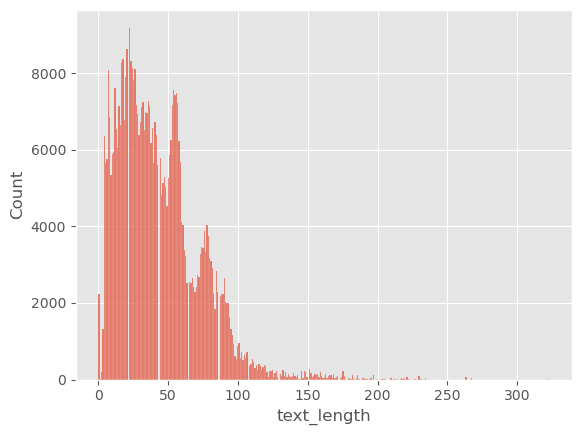

In [18]:
# Create a new column for message length
data['text_length'] = data['text'].apply(len)

# Visualize the distribution of message lengths
sns.histplot(data['text_length'])
plt.show()

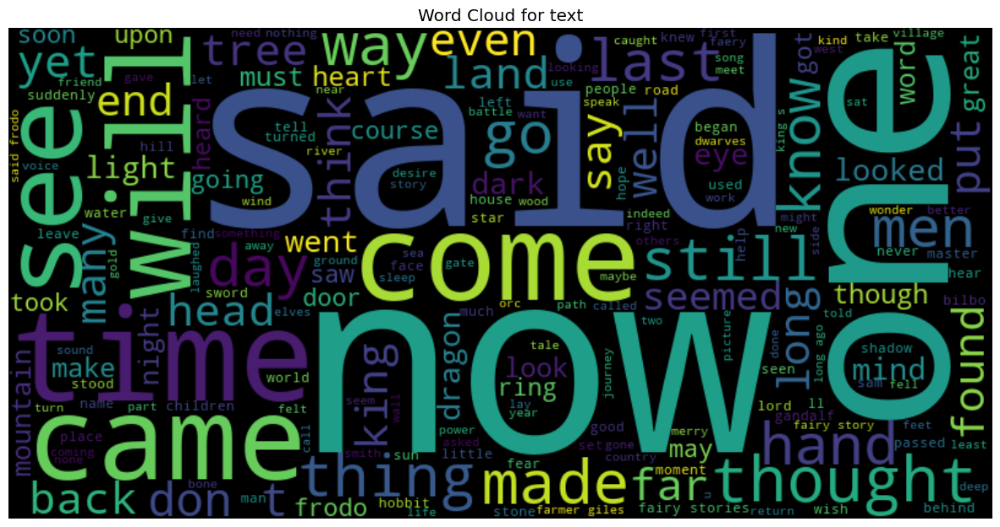

In [19]:
pip install wordcloud

from wordcloud import WordCloud

# Create a word cloud for messages
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(' '.join(data['text']))

plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for text')
plt.show()

In [21]:
# Define a function for preprocessing text
def preprocess_text(text):
    # Tokenize
    tokens = nltk.word_tokenize(text)
    
    # Lowercase
    tokens = [token.lower() for token in tokens]
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words and token.isalpha()]
    
    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    
    return ' '.join(tokens)

# Apply preprocessing to each text entry in the dataset
data['text'] = data['text'].apply(preprocess_text)


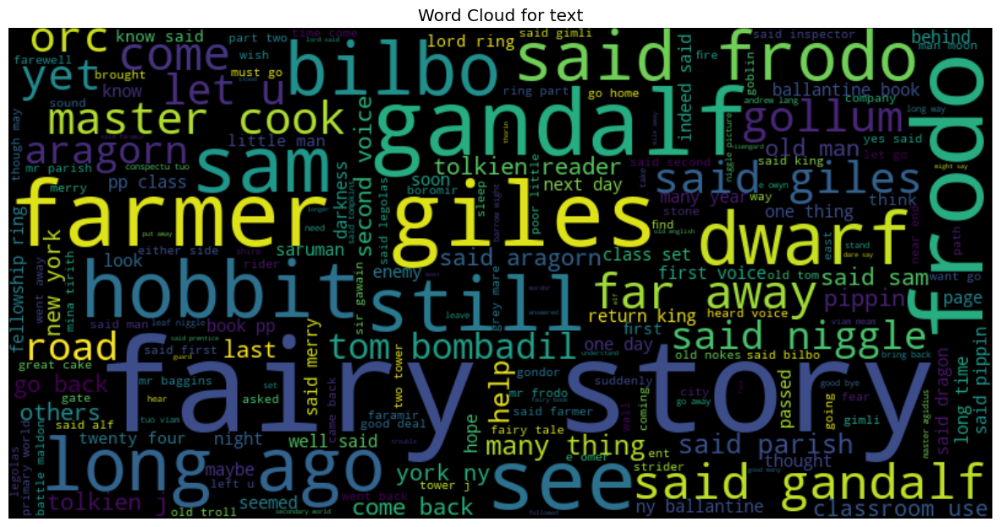

In [22]:

# Create a word cloud for messages
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(' '.join(data['text']))

plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for text')
plt.show()

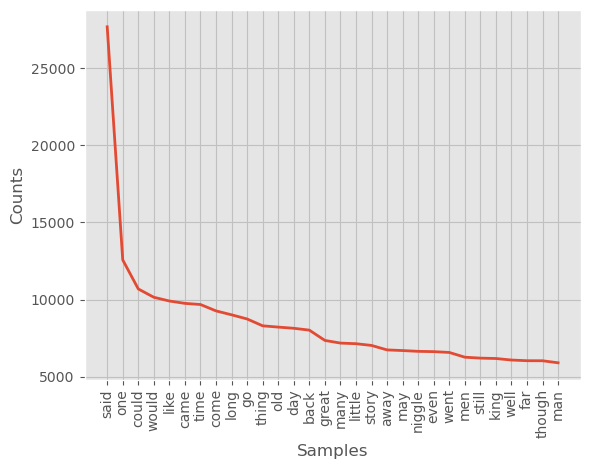

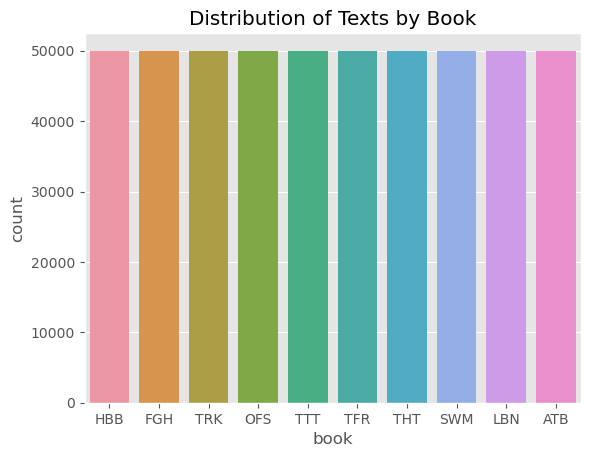

In [23]:
# Word frequency distribution
all_words = ' '.join(data['text']).split()
freq_dist = nltk.FreqDist(all_words)
freq_dist.plot(30, cumulative=False)

# Book distribution
sns.countplot(x='book', data=data)
plt.title('Distribution of Texts by Book')
plt.show()


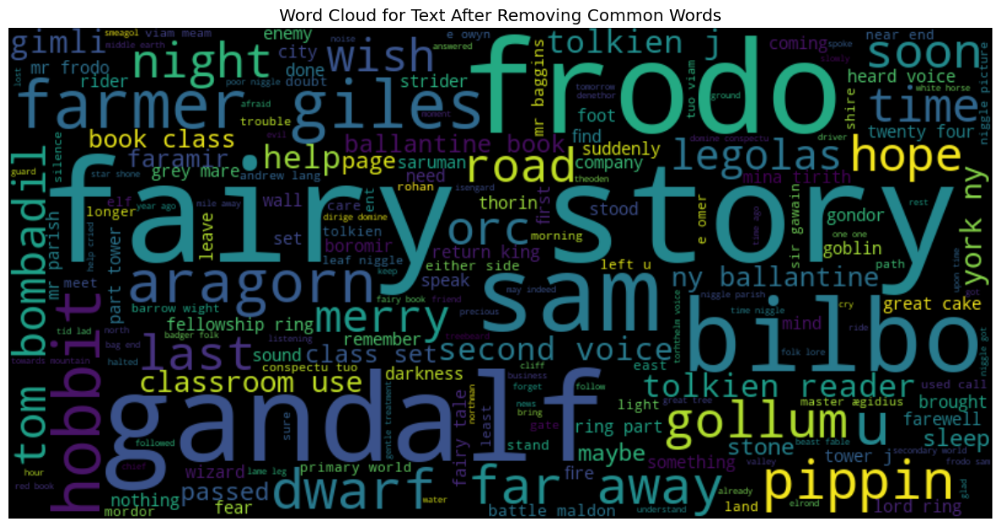

In [24]:
# Extend the stop word list
custom_stop_words = [
    'let', 'know', 'said', 'cook', 'though', 'made', 'will', 'see', 'come', 'go', 'think', 
    'look', 'want', 'back', 'get', 'asked', 'talk', 'take', 'girl', 'hear', 'well', 'yet', 
    'day', 'never', 'saw', 'perhaps', 'put', 'thing', 'always', 'man', 'even', 'told', 
    'say', 'make', 'must', 'first', 'turned', 'men', 'still', 'good', 'child', 'seemed', 
    'two', 'another', 'behind', 'others', 'tell', 'going', 'new', 'old', 'way', 'looked', 
    'came', 'thought', 'went', 'taken', 'says', 'making', 'gets', 'getting', 'sees', 'seems', 
    'wants', 'talking', 'tells', 'thinks', 'look', 'looking', 'putting', 'asking', 'having', 
    'doing', 'comes', 'going', 'giving', 'takes', 'took', 'gone', 'knew', 'known', 'knows', 
    'seen', 'without', 'within', 'across', 'among', 'between', 'high', 'low', 'big', 'small', 
    'long', 'short', 'little', 'less', 'many', 'much', 'more', 'most', 'other', 'some', 'such', 
    'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 
    'don', 'should', 'now', 'pp']

stop_words = set(stopwords.words('english')) | set(custom_stop_words)

# Updating the preprocessing function to use the extended stop words list
def preprocess_text(text, stop_words=stop_words):
    tokens = nltk.word_tokenize(text)
    tokens = [token.lower() for token in tokens]
    tokens = [token for token in tokens if token not in stop_words and token.isalpha()]
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(tokens)

# Reapplying the preprocessing to each text entry in the dataset
data['text'] = data['text'].apply(preprocess_text)

# Regenerating the word cloud with updated text
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(' '.join(data['text']))

plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Text After Removing Common Words')
plt.show()

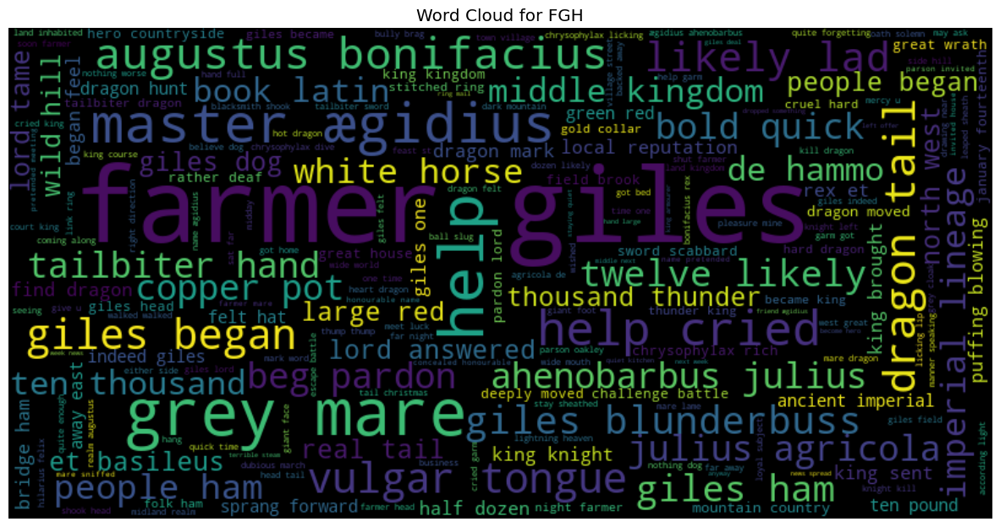

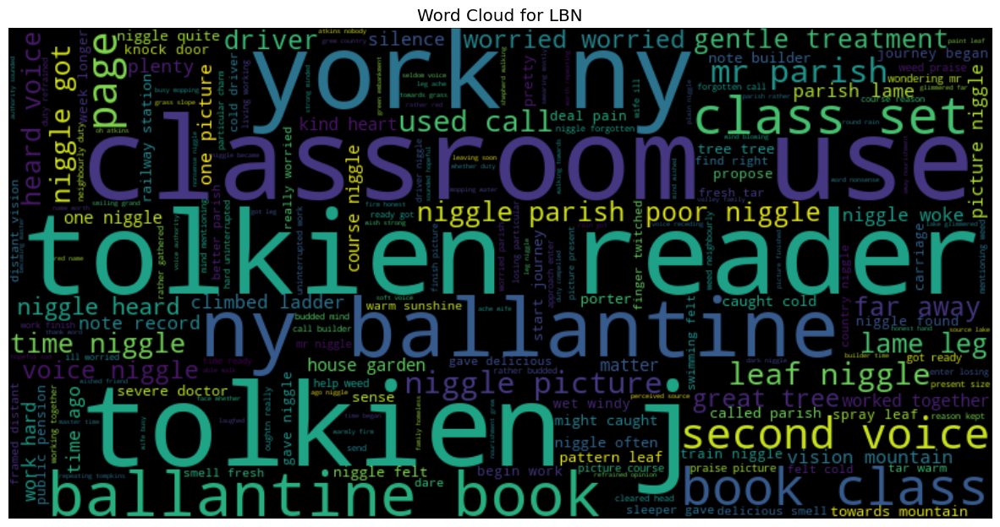

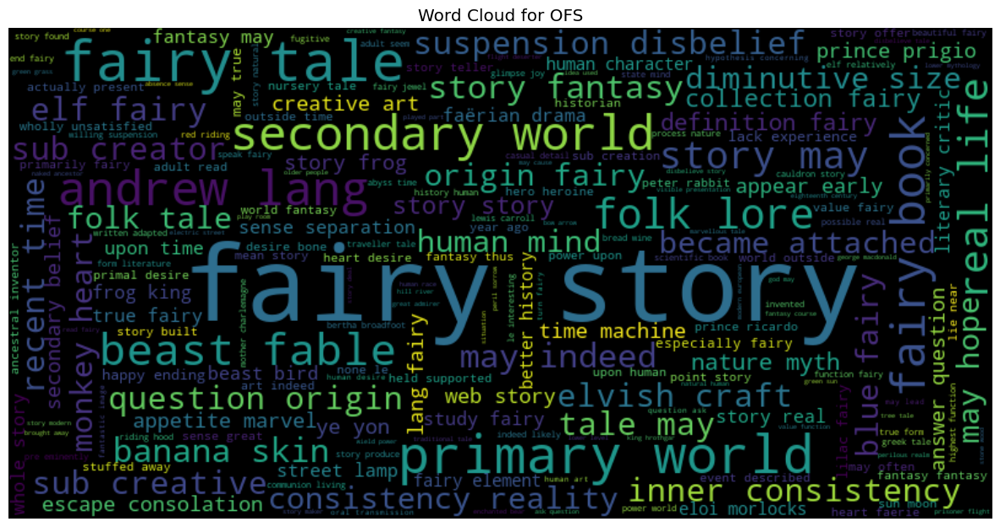

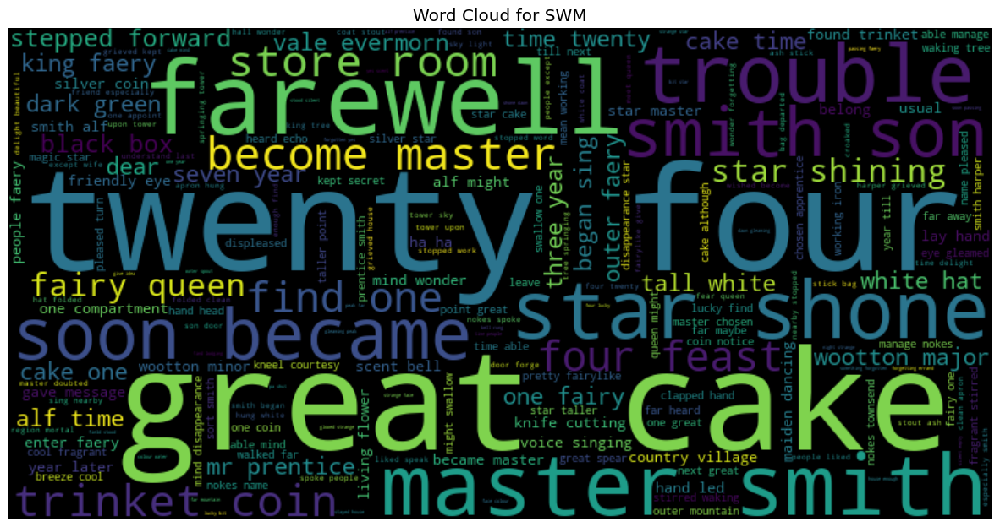

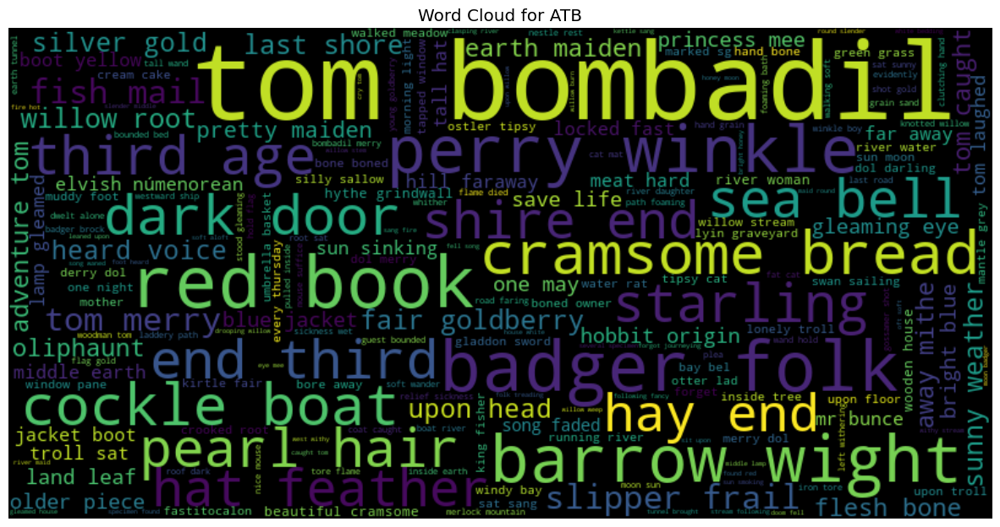

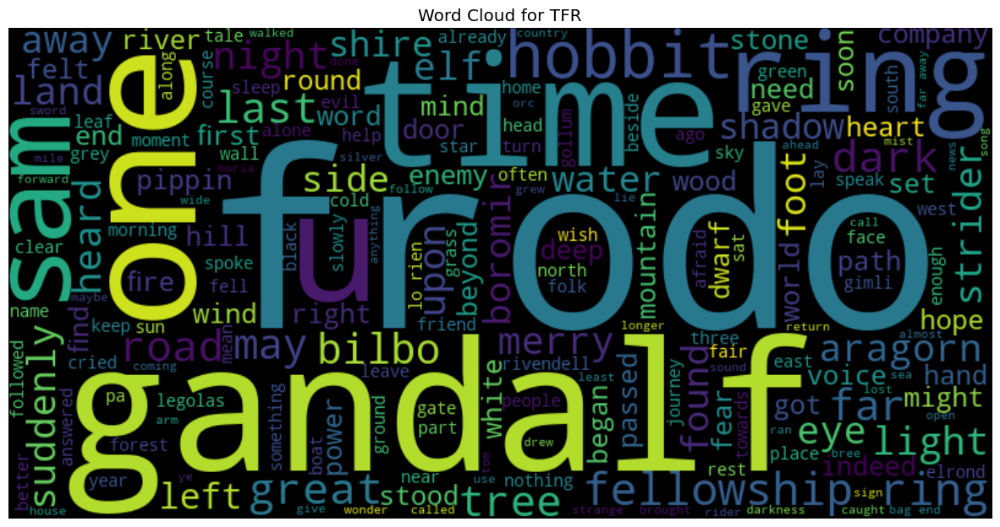

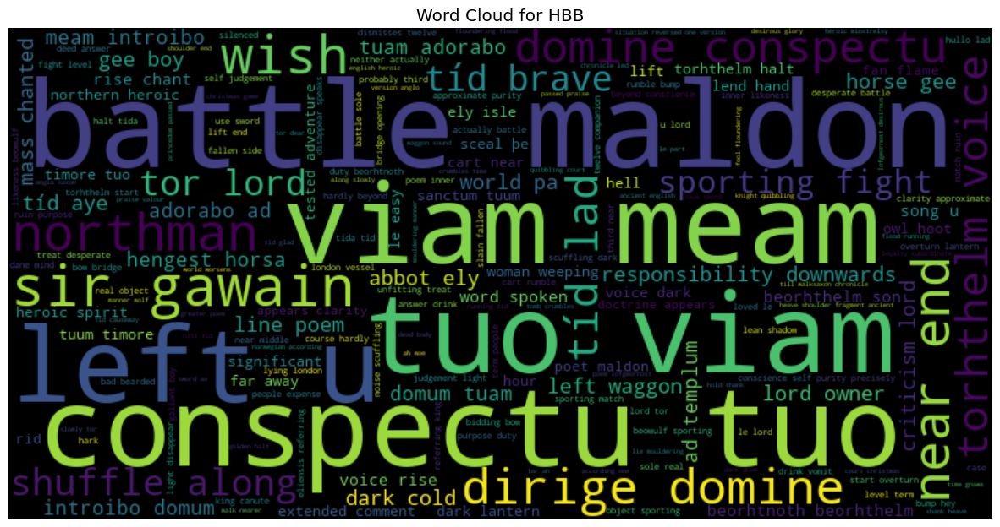

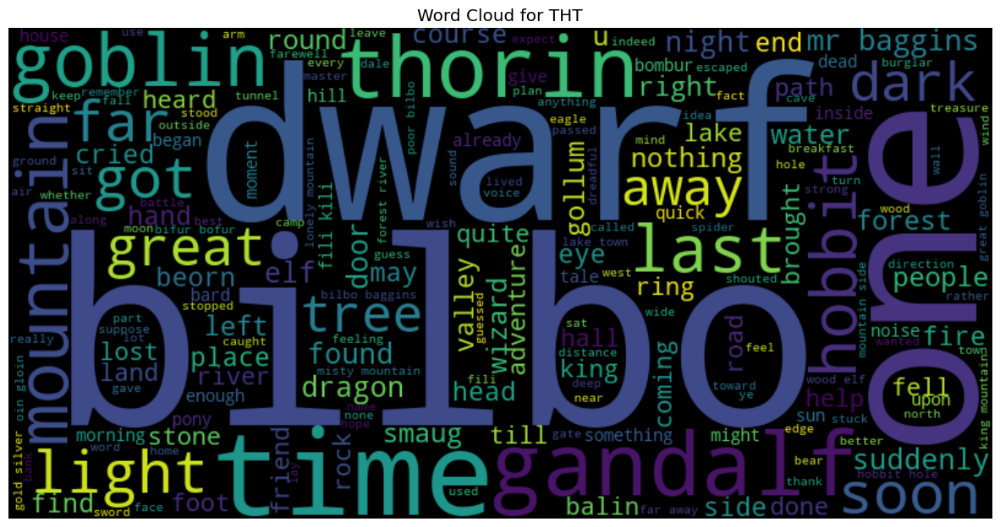

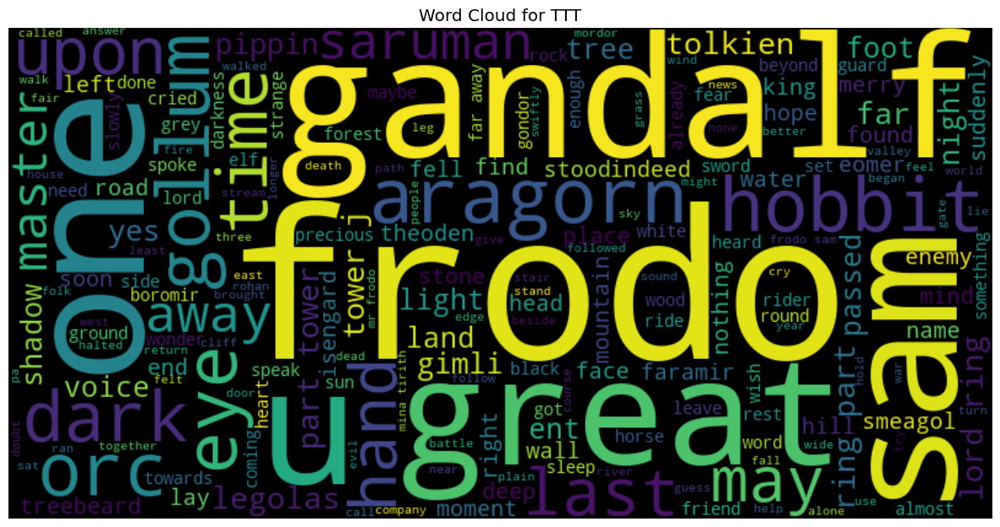

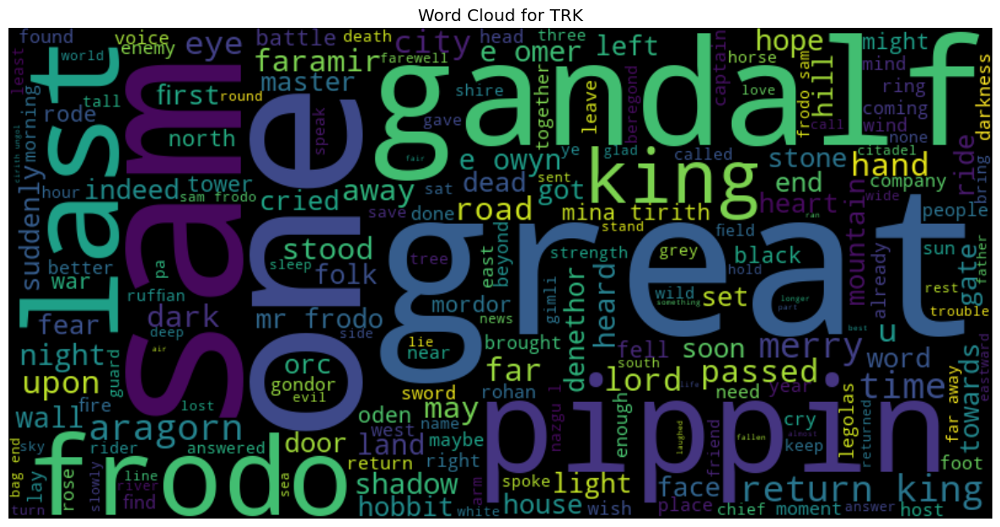

In [33]:


# Extend the stop word list with your custom stop words
custom_stop_words = [ 'let', 'know', 'said', 'cook', 'though', 'made', 'will', 'see', 'come', 'go', 'think', 
    'look', 'want', 'back', 'get', 'asked', 'talk', 'take', 'girl', 'hear', 'well', 'yet', 
    'day', 'never', 'saw', 'perhaps', 'put', 'thing', 'always', 'man', 'even', 'told', 
    'say', 'make', 'must', 'first', 'turned', 'men', 'still', 'good', 'child', 'seemed', 
    'two', 'another', 'behind', 'others', 'tell', 'going', 'new', 'old', 'way', 'looked', 
    'came', 'thought', 'went', 'taken', 'says', 'making', 'gets', 'getting', 'sees', 'seems', 
    'wants', 'talking', 'tells', 'thinks', 'look', 'looking', 'putting', 'asking', 'having', 
    'doing', 'comes', 'going', 'giving', 'takes', 'took', 'gone', 'knew', 'known', 'knows', 
    'seen', 'without', 'within', 'across', 'among', 'between', 'high', 'low', 'big', 'small', 
    'long', 'short', 'little', 'less', 'many', 'much', 'more', 'most', 'other', 'some', 'such', 
    'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 
    'don', 'should', 'now', 'pp']
stop_words = set(stopwords.words('english')) | set(custom_stop_words)

# Reapplying the preprocessing to each text entry in the dataset
data['separate_book_text'] = data['text'].apply(preprocess_text)


# Generate and display word clouds for each book
book_codes = ['FGH', 'LBN', 'OFS', 'SWM', 'ATB', 'TFR', 'HBB', 'THT', 'TTT', 'TRK']
for book in book_codes:
    book_text = ' '.join(data[data['book'] == book]['separate_book_text'])
    wordcloud = WordCloud(width=800, height=400, background_color='black').generate(book_text)
    plt.figure(figsize=(15, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {book}')
    plt.show()


In [34]:
pip install gensim


Note: you may need to restart the kernel to use updated packages.


In [35]:
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')

# Tokenize the documents
texts = [word_tokenize(document) for document in data['text']]

# Create a dictionary representation of the documents
dictionary = corpora.Dictionary(texts)

# Filter out words that occur in less than 20 documents or more than 50% of the documents
dictionary.filter_extremes(no_below=20, no_above=0.5)

# Vectorize the documents
corpus = [dictionary.doc2bow(text) for text in texts]


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [28]:

# Set training parameters
num_topics = 5  
passes = 10
iterations = 400

# Make a index to word dictionary
temp = dictionary[0]  # This is only to "load" the dictionary
id2word = dictionary.id2token

# Train the LDA model
lda_model = LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics, 
                     passes=passes, iterations=iterations, random_state=42)

# Print the topics
topics = lda_model.print_topics(num_words=5)  
for topic in topics:
    print(topic)


(0, '0.022*"story" + 0.017*"fairy" + 0.016*"would" + 0.012*"head" + 0.012*"got"')
(1, '0.022*"could" + 0.015*"niggle" + 0.015*"frodo" + 0.013*"one" + 0.011*"mind"')
(2, '0.015*"may" + 0.014*"u" + 0.010*"lord" + 0.010*"great" + 0.009*"mountain"')
(3, '0.020*"time" + 0.020*"away" + 0.017*"far" + 0.013*"voice" + 0.012*"shall"')
(4, '0.015*"tree" + 0.014*"eye" + 0.013*"like" + 0.012*"end" + 0.011*"master"')


In [36]:
from gensim import corpora, models

# Function to train LDA model and print topics for a given corpus
def extract_themes(texts, num_topics=5):
    # Create a dictionary representation of the documents
    dictionary = corpora.Dictionary(texts)
    dictionary.filter_extremes(no_below=20, no_above=0.5)
    
    # Vectorize the documents
    corpus = [dictionary.doc2bow(text) for text in texts]
    
    # Train the LDA model
    lda_model = models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=10, iterations=400, random_state=42)
    
    # Print the topics
    topics = lda_model.print_topics(num_words=5)
    for topic in topics:
        print(topic)

# Iterate through each book and extract themes
for book in data['book'].unique():
    print(f"Themes for {book}:")
    book_texts = [word_tokenize(text) for text in data[data['book'] == book]['text']]
    extract_themes(book_texts, num_topics=5)  
    print("\n")


Themes for HBB:
(0, '0.026*"tor" + 0.013*"dead" + 0.013*"u" + 0.013*"tíd" + 0.013*"death"')
(1, '0.021*"poem" + 0.018*"maldon" + 0.014*"heroic" + 0.012*"poet" + 0.012*"work"')
(2, '0.017*"near" + 0.016*"battle" + 0.012*"tuo" + 0.010*"totta" + 0.010*"head"')
(3, '0.018*"lord" + 0.016*"le" + 0.016*"word" + 0.014*"sword" + 0.012*"end"')
(4, '0.025*"tíd" + 0.014*"lad" + 0.014*"like" + 0.012*"master" + 0.011*"dark"')


Themes for FGH:
(0, '0.037*"dragon" + 0.021*"giles" + 0.018*"name" + 0.014*"ham" + 0.014*"tailbiter"')
(1, '0.019*"farmer" + 0.019*"could" + 0.014*"giant" + 0.014*"king" + 0.013*"land"')
(2, '0.044*"farmer" + 0.038*"giles" + 0.030*"dragon" + 0.025*"king" + 0.010*"away"')
(3, '0.029*"knight" + 0.024*"help" + 0.019*"giles" + 0.017*"got" + 0.016*"garm"')
(4, '0.028*"dog" + 0.025*"mare" + 0.017*"would" + 0.014*"one" + 0.013*"time"')


Themes for TRK:
(0, '0.050*"sam" + 0.042*"frodo" + 0.024*"great" + 0.017*"like" + 0.015*"face"')
(1, '0.030*"away" + 0.023*"time" + 0.023*"may" + 0

C:\Users\PC\AppData\Local\Temp\ipykernel_21652\2008628751.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['sentence_length'], bins=30, kde=True)


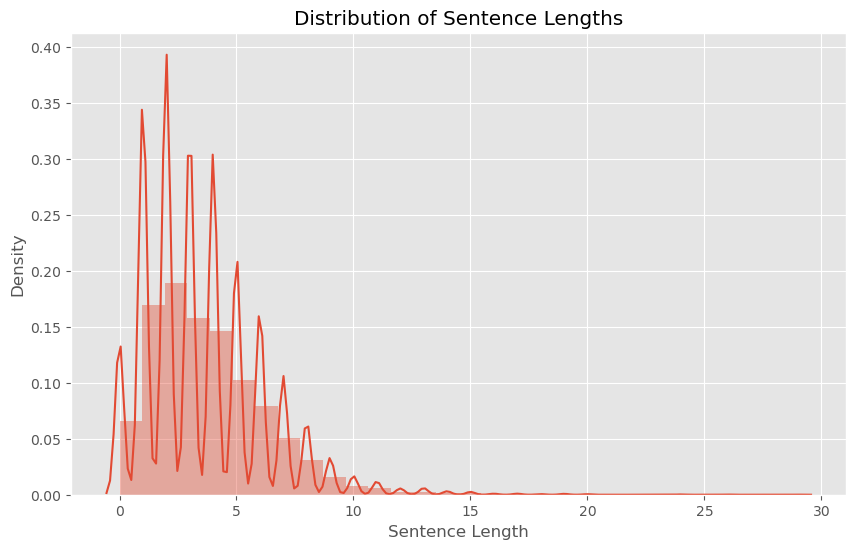

In [37]:
# Calculate sentence length
data['sentence_length'] = data['text'].apply(lambda x: len(x.split()))

# Plot the distribution of sentence lengths
plt.figure(figsize=(10, 6))
sns.distplot(data['sentence_length'], bins=30, kde=True)
plt.title('Distribution of Sentence Lengths')
plt.xlabel('Sentence Length')
plt.ylabel('Density')
plt.show()



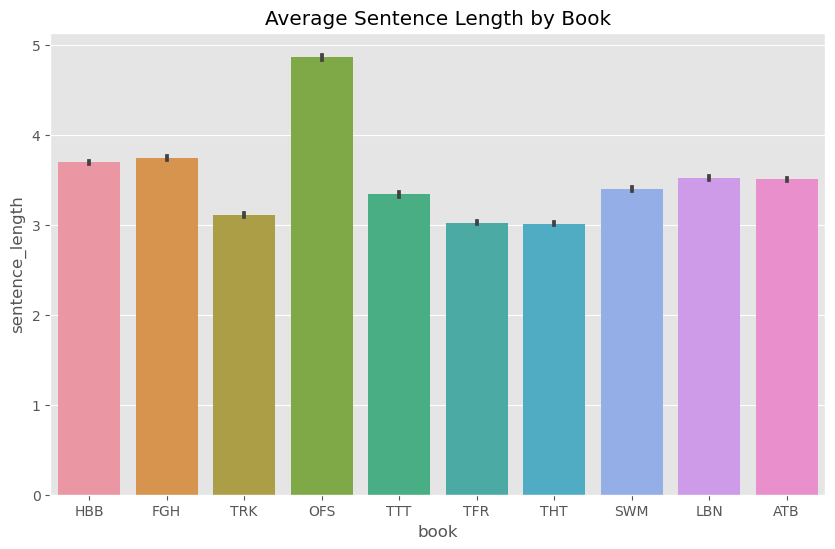

In [38]:
# Average sentence length by book
plt.figure(figsize=(10, 6))
sns.barplot(x='book', y='sentence_length', data=data)
plt.title('Average Sentence Length by Book')
plt.show()


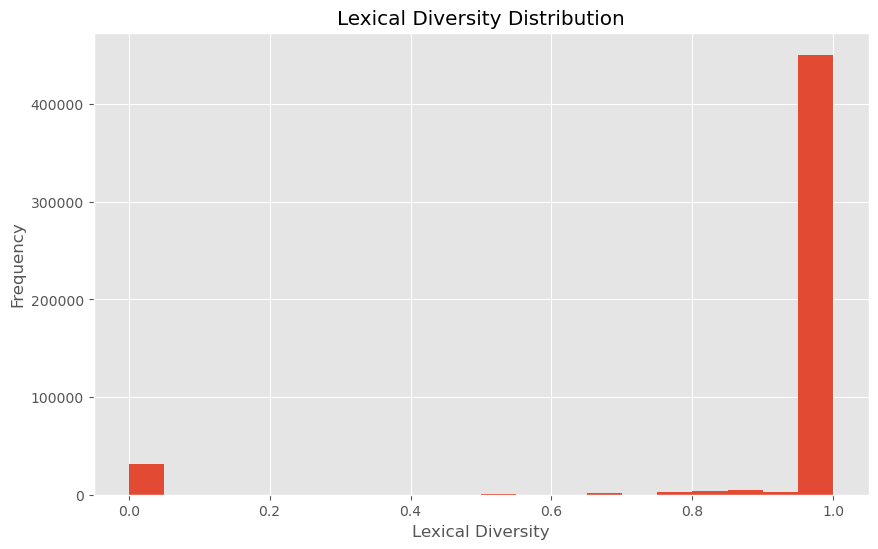

In [39]:
def lexical_diversity(text):
    tokens = text.split()
    if len(tokens) == 0:
        return 0
    return len(set(tokens)) / len(tokens)

data['lexical_diversity'] = data['text'].apply(lexical_diversity)

plt.figure(figsize=(10, 6))
plt.hist(data['lexical_diversity'], bins=20) 
plt.title('Lexical Diversity Distribution')
plt.xlabel('Lexical Diversity')
plt.ylabel('Frequency')
plt.show()



[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


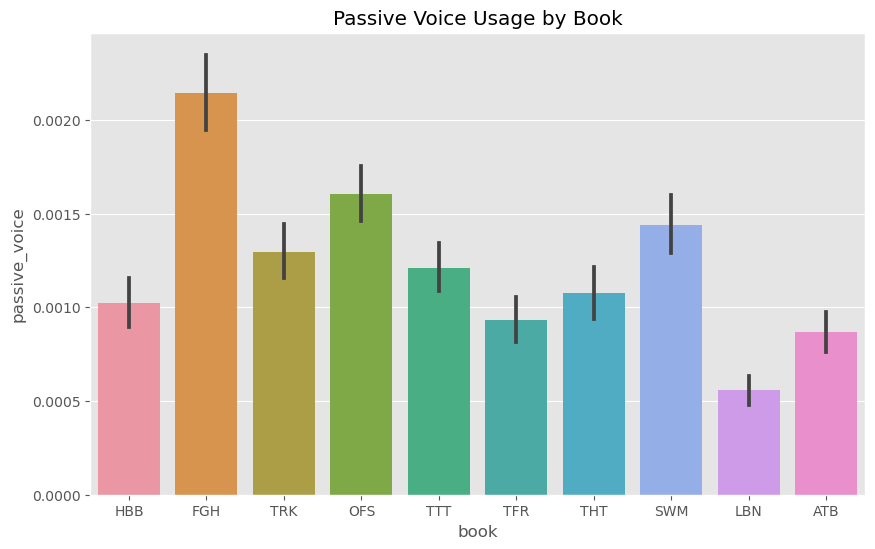

In [40]:
# Passive voice ratio
nltk.download('averaged_perceptron_tagger')
def passive_voice_ratio(text):
    tokens = nltk.word_tokenize(text)
    tagged = nltk.pos_tag(tokens)
    passive_count = sum(1 for i in range(len(tagged)-2) if tagged[i][1] in ['VBD', 'VBZ', 'VBP', 'VBG', 'VBN'] and tagged[i+1][1] == 'VBN')
    if len(tokens) == 0:
        return 0
    return passive_count / len(tokens)

data['passive_voice'] = data['text'].apply(passive_voice_ratio)

plt.figure(figsize=(10, 6))
sns.barplot(x='book', y='passive_voice', data=data)
plt.title('Passive Voice Usage by Book')
plt.show()


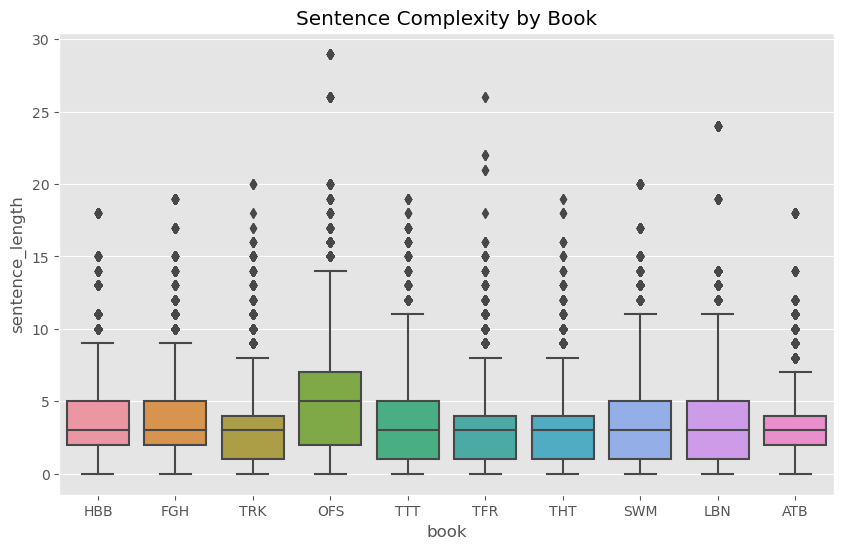

In [41]:
# We already have sentence length. Let's use it to analyze complexity. NR
plt.figure(figsize=(10, 6))
sns.boxplot(x='book', y='sentence_length', data=data)
plt.title('Sentence Complexity by Book')
plt.show()

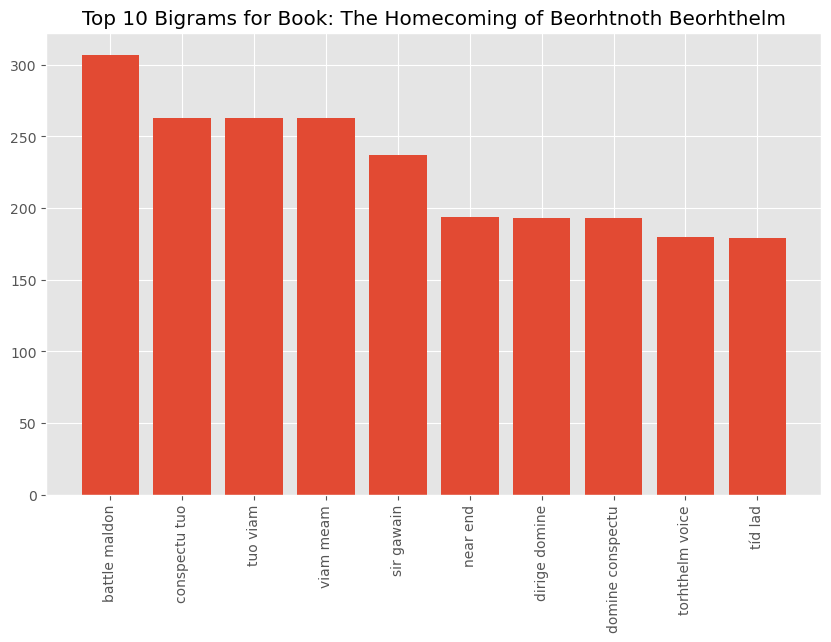

In [45]:
from sklearn.feature_extraction.text import CountVectorizer 


def get_top_ngram(corpus, n=None, ngram=2):
    vec = CountVectorizer(ngram_range=(ngram, ngram), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# Example for bigrams for HBB
top_bigrams = get_top_ngram(data[data['book'] == 'HBB']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific Book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book: The Homecoming of Beorhtnoth Beorhthelm')
plt.xticks(rotation=90)
plt.show()


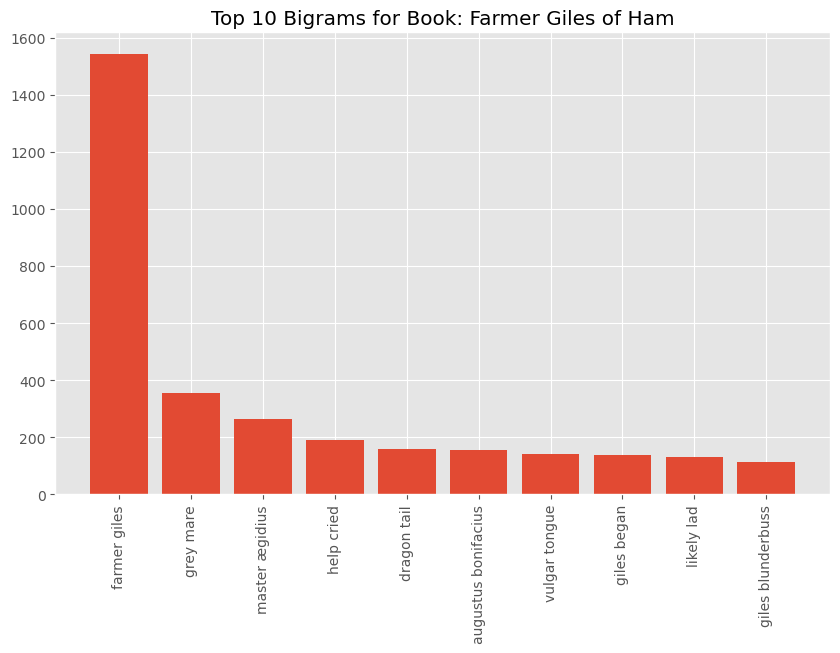

In [46]:
# for bigrams for FGH
top_bigrams = get_top_ngram(data[data['book'] == 'FGH']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book: Farmer Giles of Ham')
plt.xticks(rotation=90)
plt.show()

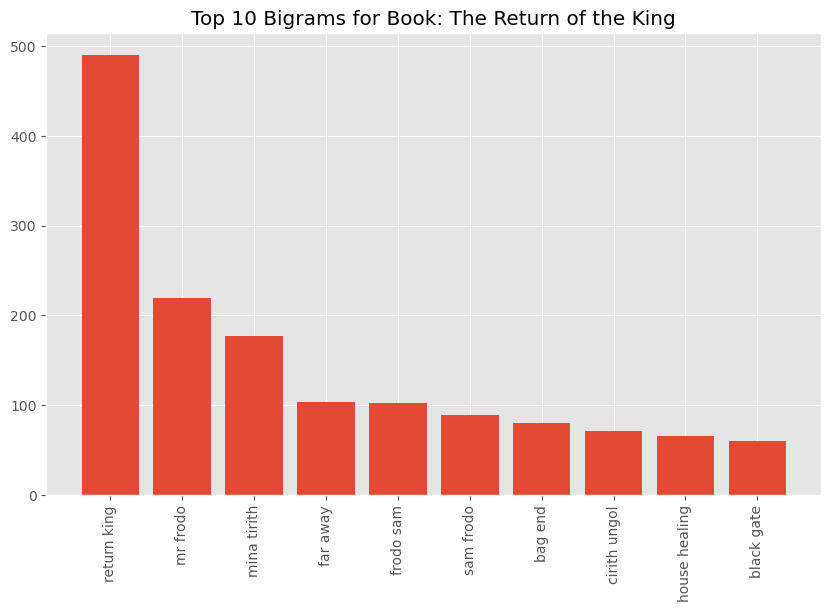

In [47]:
# for Bigrams for TRK
top_bigrams = get_top_ngram(data[data['book'] == 'TRK']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book: The Return of the King')
plt.xticks(rotation=90)
plt.show()

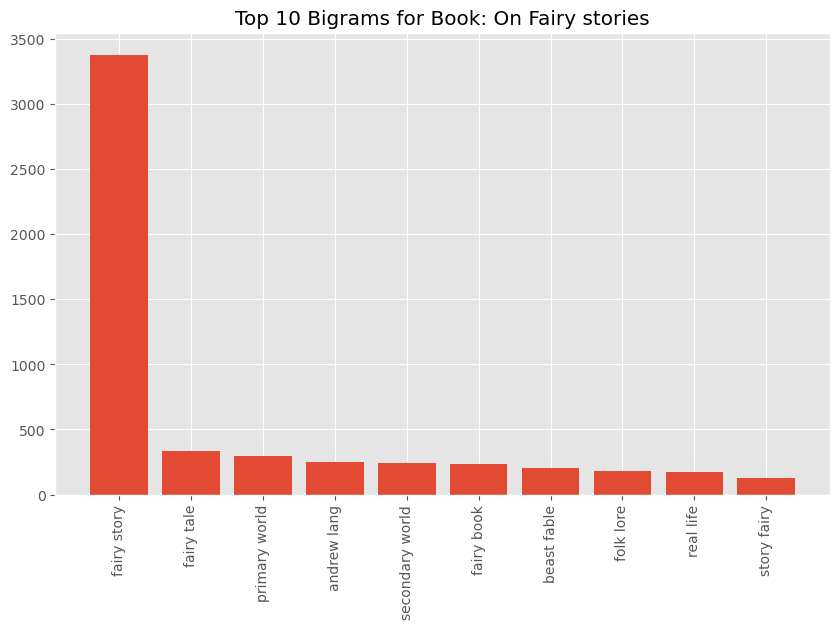

In [48]:
# for bigrams for OFS
top_bigrams = get_top_ngram(data[data['book'] == 'OFS']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book: On Fairy stories')
plt.xticks(rotation=90)
plt.show()

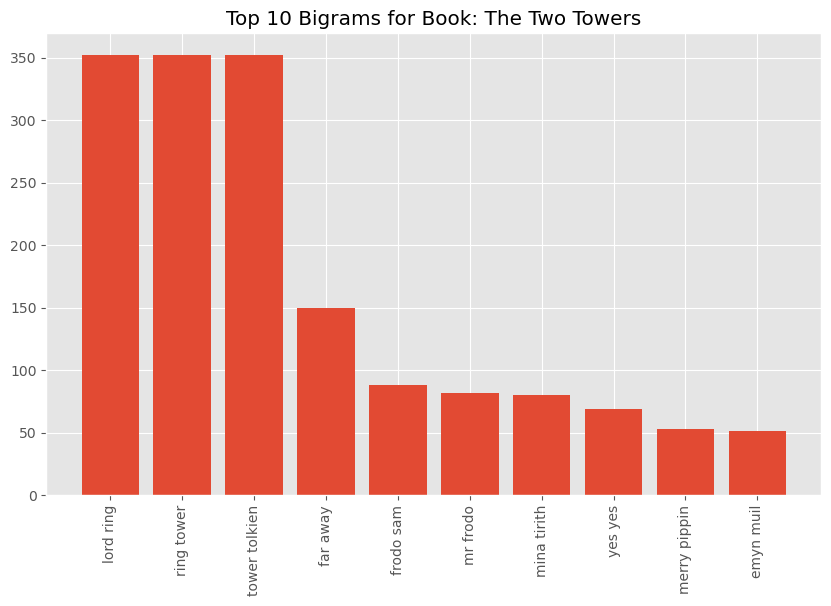

In [49]:
# for bigrams for TTT
top_bigrams = get_top_ngram(data[data['book'] == 'TTT']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific Book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book: The Two Towers')
plt.xticks(rotation=90)
plt.show()

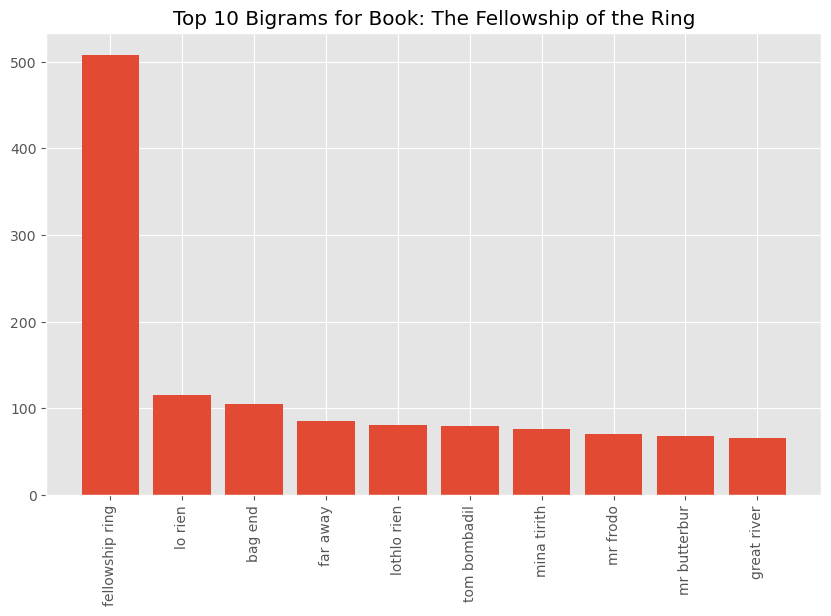

In [50]:
# for bigrams for TFR
top_bigrams = get_top_ngram(data[data['book'] == 'TFR']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book: The Fellowship of the Ring')
plt.xticks(rotation=90)
plt.show()

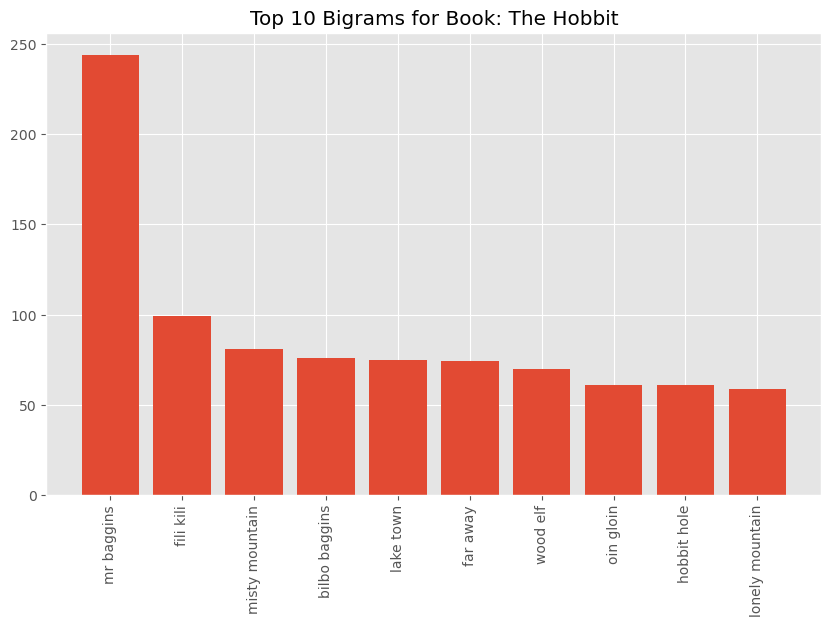

In [51]:
# for bigrams for THT
top_bigrams = get_top_ngram(data[data['book'] == 'THT']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book: The Hobbit')
plt.xticks(rotation=90)
plt.show()

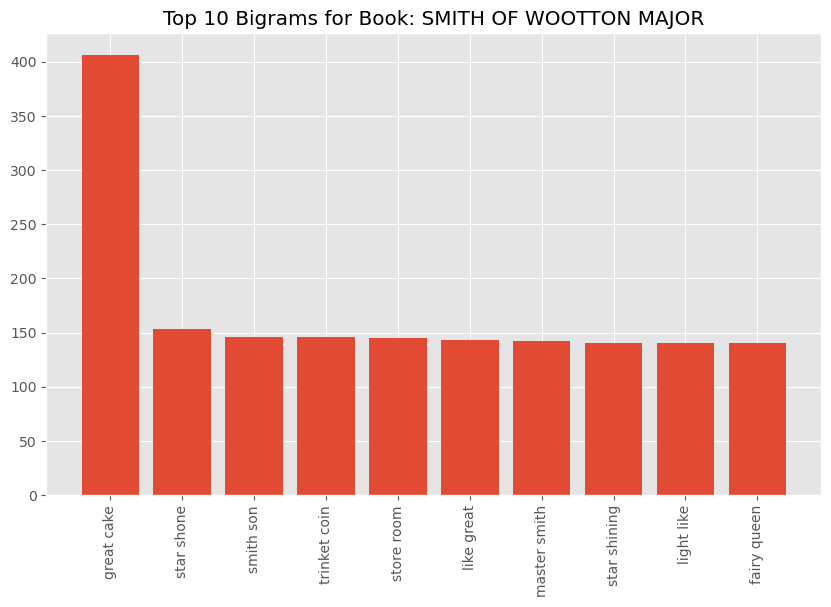

In [52]:
# for bigrams for SWM
top_bigrams = get_top_ngram(data[data['book'] == 'SWM']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book: SMITH OF WOOTTON MAJOR')
plt.xticks(rotation=90)
plt.show()

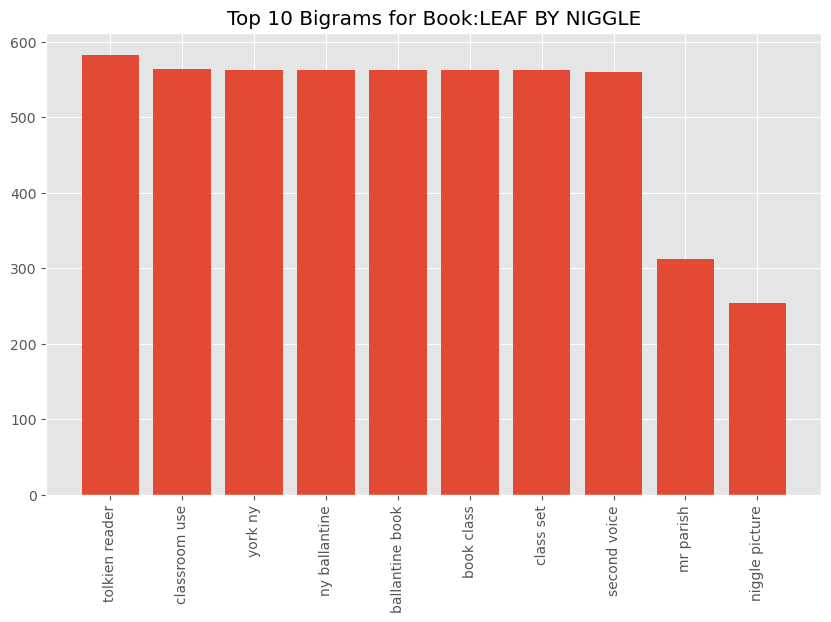

In [53]:
# for bigrams for LBN
top_bigrams = get_top_ngram(data[data['book'] == 'LBN']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book:LEAF BY NIGGLE')
plt.xticks(rotation=90)
plt.show()

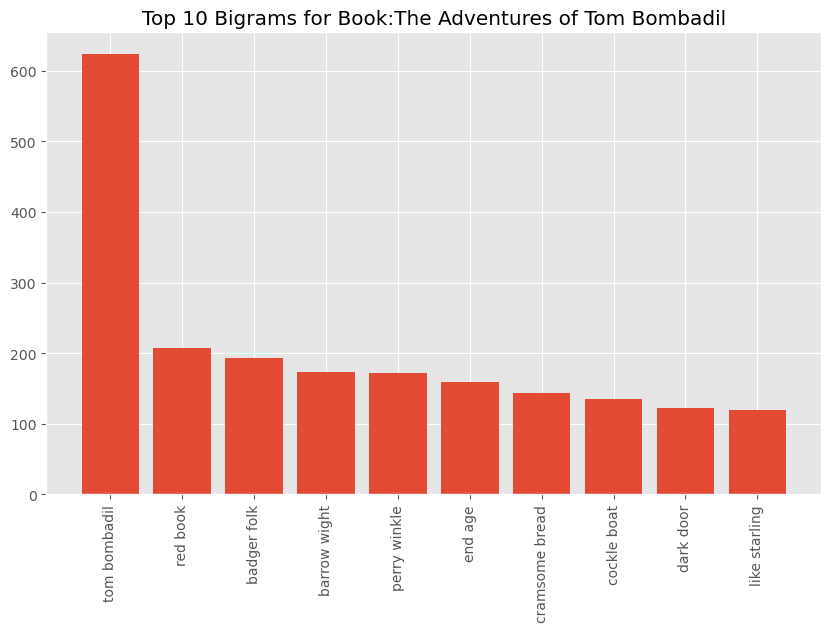

In [54]:
# for bigrams for ATB
top_bigrams = get_top_ngram(data[data['book'] == 'ATB']['text'], n=10, ngram=2)  

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Bigrams for Book:The Adventures of Tom Bombadil')
plt.xticks(rotation=90)
plt.show()

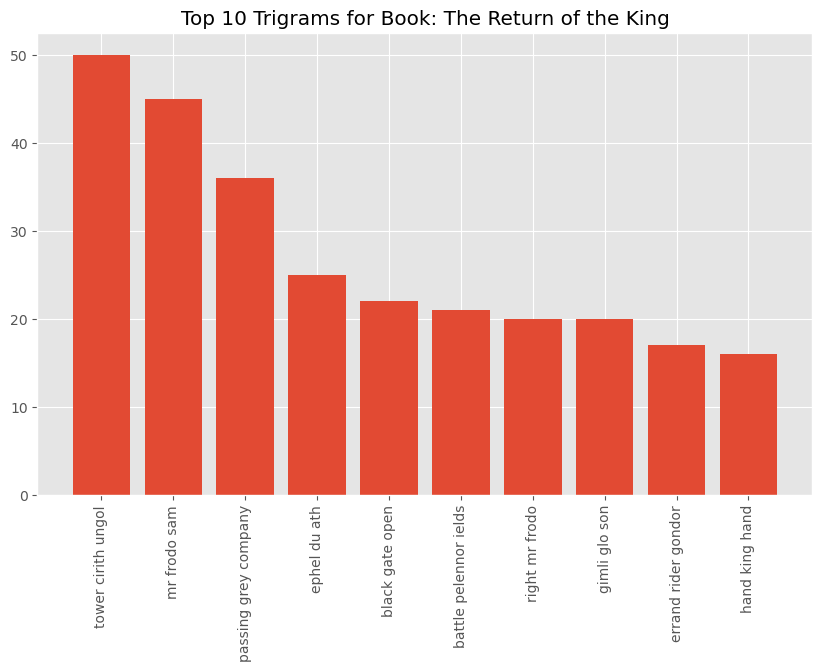

In [55]:
# for TRK trigrams
top_bigrams = get_top_ngram(data[data['book'] == 'TRK']['text'], n=10, ngram=3) 

# Plotting top bigrams for a specific book
plt.figure(figsize=(10, 6))
x, y = zip(*top_bigrams)
plt.bar(x, y)
plt.title('Top 10 Trigrams for Book: The Return of the King')
plt.xticks(rotation=90)
plt.show()


In [56]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report

# TF-IDF vectorization
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(data['text'])
y = data['book']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(random_state=42, max_iter=1000)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

         ATB       0.77      0.88      0.82      9947
         FGH       0.78      0.80      0.79     10024
         HBB       0.88      0.94      0.91      9974
         LBN       0.80      0.89      0.84      9955
         OFS       0.87      0.88      0.88      9992
         SWM       0.74      0.80      0.77     10075
         TFR       0.31      0.43      0.36     10079
         THT       0.60      0.48      0.53     10043
         TRK       0.53      0.38      0.45     10035
         TTT       0.53      0.35      0.43      9876

    accuracy                           0.68    100000
   macro avg       0.68      0.68      0.68    100000
weighted avg       0.68      0.68      0.68    100000



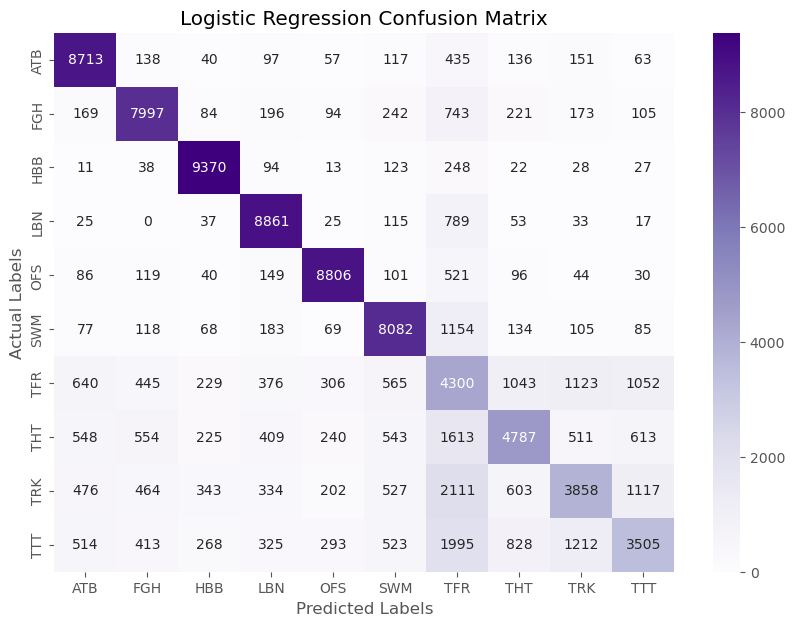

In [57]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Generate the confusion matrix for Logistic Regression
lr_conf_matrix = confusion_matrix(y_test, y_pred)


# Label encoding classes
label_encoder = LabelEncoder()
label_encoder.fit(y_test) 

# Plotting the heatmap for Logistic Regression
plt.figure(figsize=(10, 7))
sns.heatmap(lr_conf_matrix, annot=True, fmt='d', cmap="Purples", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Logistic Regression Confusion Matrix')
plt.ylabel('Actual Labels')
plt.xlabel('Predicted Labels')
plt.show()



In [58]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize the Multinomial Naive Bayes classifier
nb_classifier = MultinomialNB()

# Fit the classifier to the training data
nb_classifier.fit(X_train, y_train)

# Make predictions on the test data
nb_predictions = nb_classifier.predict(X_test)

# Print the classification report for Naive Bayes
print("Naive Bayes Classification Report:")
print(classification_report(y_test, nb_predictions))


Naive Bayes Classification Report:
              precision    recall  f1-score   support

         ATB       0.70      0.79      0.74      9947
         FGH       0.73      0.70      0.72     10024
         HBB       0.82      0.85      0.84      9974
         LBN       0.73      0.84      0.78      9955
         OFS       0.80      0.81      0.80      9992
         SWM       0.65      0.73      0.69     10075
         TFR       0.48      0.30      0.37     10079
         THT       0.57      0.43      0.49     10043
         TRK       0.51      0.37      0.43     10035
         TTT       0.30      0.44      0.36      9876

    accuracy                           0.63    100000
   macro avg       0.63      0.63      0.62    100000
weighted avg       0.63      0.63      0.62    100000



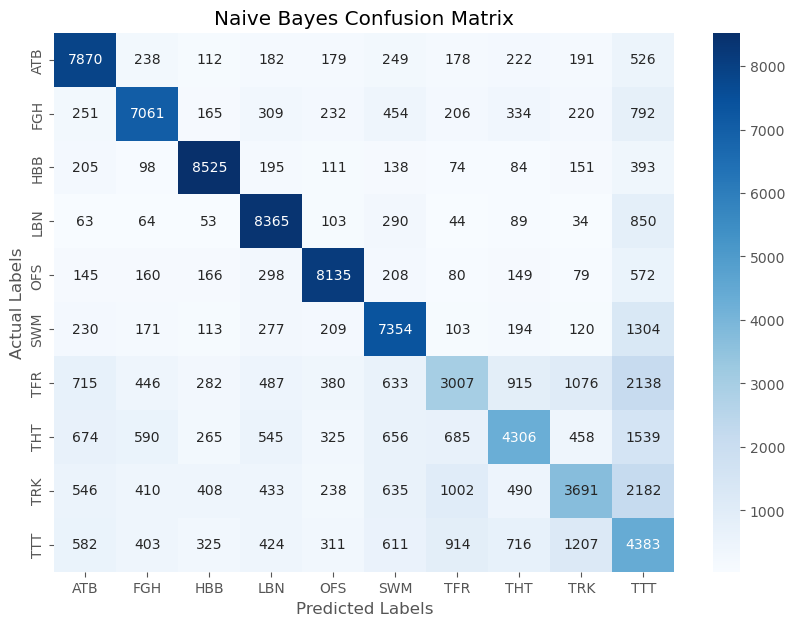

In [59]:
# Generate the confusion matrix for Naive Bayes
nb_conf_matrix = confusion_matrix(y_test, nb_predictions)

# Plotting the heatmap
plt.figure(figsize=(10,7))
sns.heatmap(nb_conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Naive Bayes Confusion Matrix')
plt.ylabel('Actual Labels')
plt.xlabel('Predicted Labels')
plt.show()


In [60]:
pip install textblob


Note: you may need to restart the kernel to use updated packages.


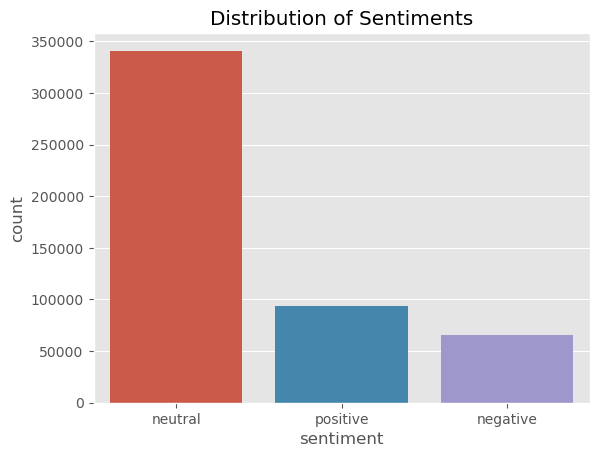

In [61]:
from textblob import TextBlob

# Define a function to get sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    if analysis.sentiment.polarity > 0:
        return 'positive'
    elif analysis.sentiment.polarity == 0:
        return 'neutral'
    else:
        return 'negative'

# Apply the function to the dataset
data['sentiment'] = data['text'].apply(get_sentiment)

# See the distribution of sentiment
sns.countplot(x='sentiment', data=data)
plt.title('Distribution of Sentiments')
plt.show()

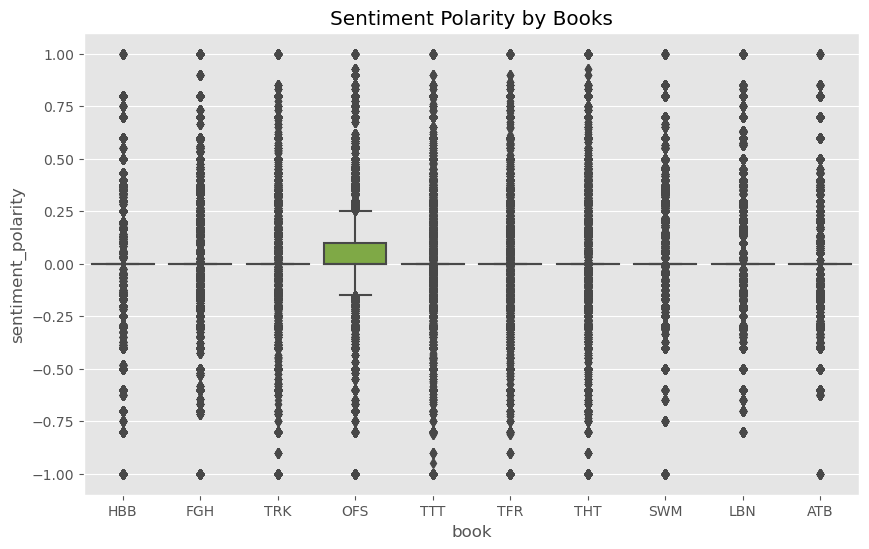

In [62]:

# Function to compute average sentiment polarity
def average_sentiment(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity

data['sentiment_polarity'] = data['text'].apply(average_sentiment)

plt.figure(figsize=(10, 6))
sns.boxplot(x='book', y='sentiment_polarity', data=data)
plt.title('Sentiment Polarity by Books')
plt.show()


In [63]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Download necessary NLTK resources
nltk.download('vader_lexicon')
nltk.download('omw-1.4')


sentiment = SentimentIntensityAnalyzer()

# Apply sentiment analysis and create new columns
data['compound'] = [sentiment.polarity_scores(text)['compound'] for text in data['text']]
data['neg'] = [sentiment.polarity_scores(text)['neg'] for text in data['text']]
data['neu'] = [sentiment.polarity_scores(text)['neu'] for text in data['text']]
data['pos'] = [sentiment.polarity_scores(text)['pos'] for text in data['text']]


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [51]:
data[['compound', 'neg', 'neu', 'pos' ]].describe()

,compound,neg,neu,pos
count,900000.000000,900000.000000,900000.000000,900000.000000
mean,0.006579,0.108081,0.720642,0.116784
std,0.297721,0.229883,0.349356,0.236736
min,-0.973500,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.462000,0.000000
50%,0.000000,0.000000,1.000000,0.000000
75%,0.000000,0.000000,1.000000,0.000000
max,0.970500,1.000000,1.000000,1.000000


In [64]:
data.head()

,text,book,text_length,sentence_length,separate_book_text,lexical_diversity,passive_voice,sentiment,sentiment_polarity,compound,neg,neu,pos
0,thrash villain,HBB,24,2,thrash villain,1.000,0.0,neutral,0.0,-0.5574,0.783,0.217,0.000
1,sent,FGH,9,1,sent,1.000,0.0,neutral,0.0,0.0000,0.000,1.000,0.000
2,,TRK,13,0,,0.000,0.0,neutral,0.0,0.0000,0.000,0.000,0.000
3,measure real maker hope drawing reality hope p...,OFS,89,8,measure real maker hope drawing reality hope p...,0.875,0.0,positive,0.2,0.7506,0.000,0.403,0.597
4,,TTT,4,0,,0.000,0.0,neutral,0.0,0.0000,0.000,0.000,0.000


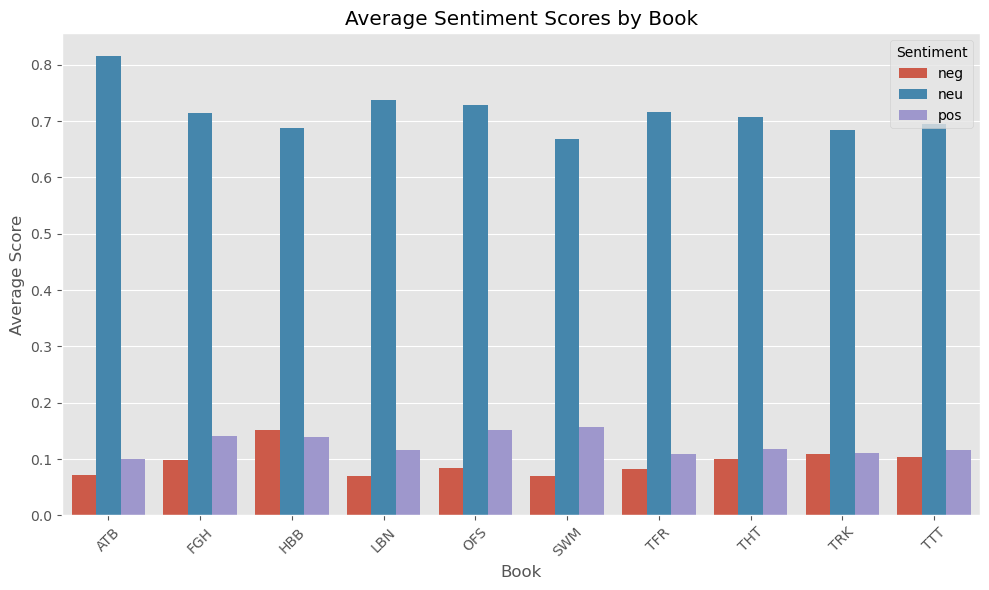

In [65]:
# Group by book and calculate mean sentiment scores
sentiment_by_book = data.groupby('book').agg({'neg': 'mean', 'neu': 'mean', 'pos': 'mean'}).reset_index()

# Melting the DataFrame to make it suitable for seaborn's barplot
sentiment_melted = pd.melt(sentiment_by_book, id_vars=['book'], value_vars=['neg', 'neu', 'pos'], var_name='Sentiment', value_name='Score')

# Creating the plot
plt.figure(figsize=(10, 6))
sns.barplot(x='book', y='Score', hue='Sentiment', data=sentiment_melted)
plt.xticks(rotation=45)
plt.title('Average Sentiment Scores by Book')
plt.ylabel('Average Score')
plt.xlabel('Book')
plt.tight_layout()
plt.show()


<Axes: xlabel='compound', ylabel='Count'>

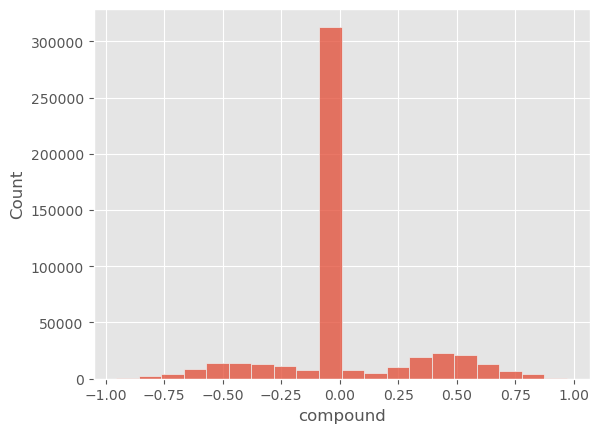

In [66]:
sns.histplot(data['compound'])

<Axes: xlabel='pos', ylabel='Count'>

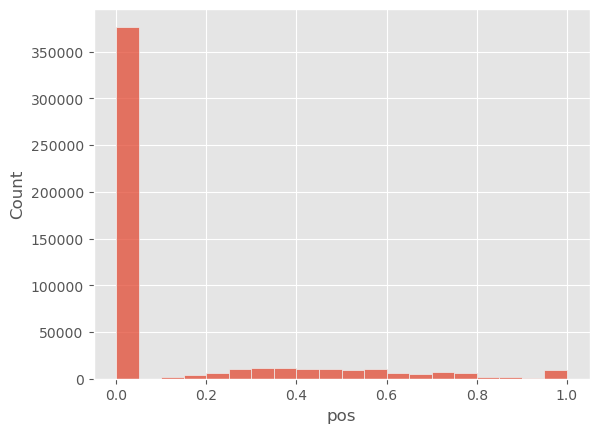

In [67]:
sns.histplot(data['pos'])

<Axes: xlabel='neg', ylabel='Count'>

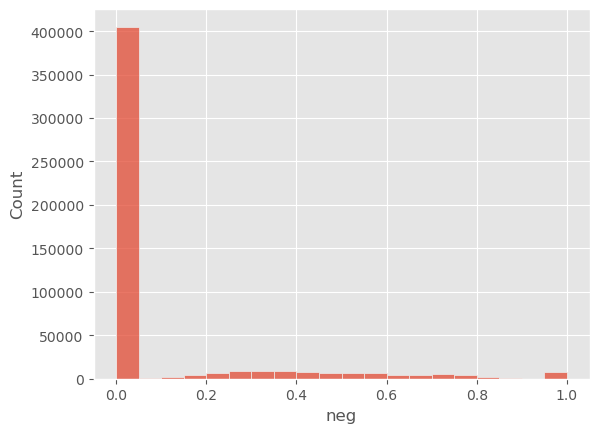

In [68]:
sns.histplot(data['neg'])

<Axes: xlabel='neu', ylabel='Count'>

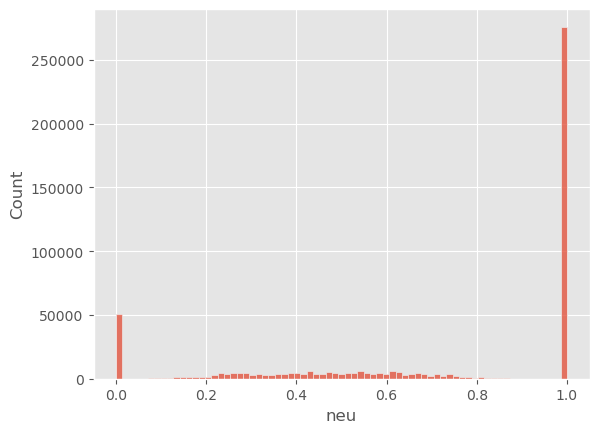

In [69]:
sns.histplot(data['neu'])

In [70]:
(data['compound']<=0).groupby(data['book']).sum()

book
ATB    40856
FGH    37343
HBB    38683
LBN    39637
OFS    34553
SWM    36246
TFR    40663
THT    40420
TRK    40548
TTT    39878
Name: compound, dtype: int64

In [71]:

# Calculate the percentage of 'pos' and 'neg' sentiments that are greater than a threshold (e.g., 0.05 for 'pos' and 'neg')

data['pos_flag'] = data['pos'] > 0.05  
data['neg_flag'] = data['neg'] > 0.05  

# Group by book and calculate the sum of flags for 'pos' and 'neg'
sentiment_flags_sum = data.groupby('book').agg({'pos_flag': 'sum', 'neg_flag': 'sum'}).reset_index()

# Calculate the total number of sentiments per book for normalization
sentiment_flags_sum['total'] = data.groupby('book')['text'].count().values

# Calculate the percentage of 'pos' and 'neg' sentiments for each book
sentiment_flags_sum['percent_pos'] = (sentiment_flags_sum['pos_flag'] / sentiment_flags_sum['total']) * 100
sentiment_flags_sum['percent_neg'] = (sentiment_flags_sum['neg_flag'] / sentiment_flags_sum['total']) * 100

# Select and display relevant columns
percentage_flags = sentiment_flags_sum[['book', 'percent_pos', 'percent_neg']]
percentage_flags


,book,percent_pos,percent_neg
0,ATB,19.676,15.422
1,FGH,28.338,21.024
2,HBB,26.560,28.344
3,LBN,23.272,15.514
4,OFS,34.568,21.388
5,SWM,29.006,14.002
6,TFR,20.360,15.680
7,THT,21.244,18.348
8,TRK,21.146,20.138
9,TTT,22.618,19.956
